# Machine Vision Lab 1
> Name - Ojas Patil
>
> Register Number - 21BAI1106

### Task 1: Image Collage Creation - To Create a collage of images using OpenCV and Matplotlib.

In [81]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

1.  Read multiple images using OpenCV.

In [82]:
def read_img_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        images.append((filename, img))
    return images

In [83]:
folder_path = '/content/images'
images = read_img_from_folder(folder_path)

 2. Convert each image to grayscale

In [84]:
def convert_to_gs(images):
    grayscale_images = [(name, cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)) for name, img in images]
    return grayscale_images

In [85]:
grayscale_images = convert_to_gs(images)

3. Display the original and grayscale images side by side using Matplotlib.

In [86]:
def display_imgs_side_by_side(images, grayscale_images):
    n = len(images)
    fig, axes = plt.subplots(n, 2, figsize=(10, 5*n))
    for i, ((orig_name, orig_img), (gray_name, gray_img)) in enumerate(zip(images, grayscale_images)):
        # Display original image
        axes[i, 0].imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f'Original - {orig_name}')
        axes[i, 0].axis('off')
        # Display grayscale image
        axes[i, 1].imshow(gray_img, cmap='gray')
        axes[i, 1].set_title(f'Grayscale - {gray_name}')
        axes[i, 1].axis('off')
    plt.tight_layout()
    plt.show()

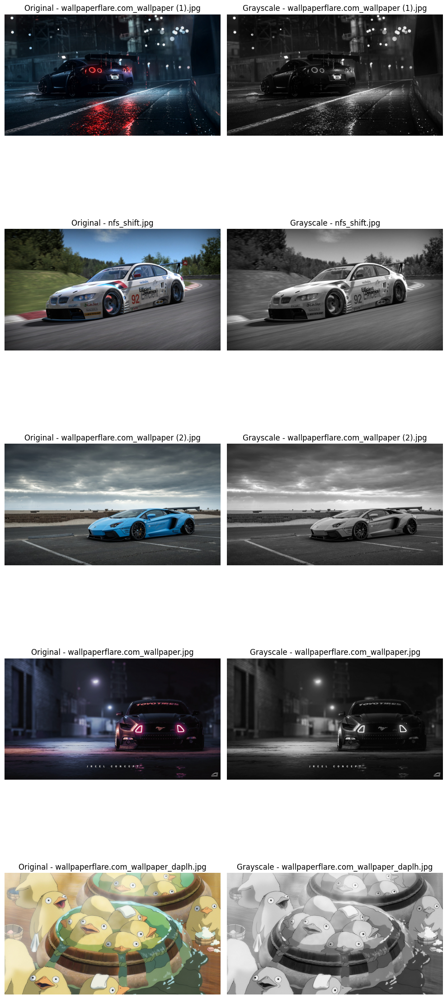

In [87]:
display_imgs_side_by_side(images, grayscale_images)

 4. Combine the grayscale images into a single collage image.

In [88]:
def create_collage(grayscale_images, collage_shape):
    rows, cols = collage_shape
    collage_rows = []
    for r in range(rows):
        row_images = [grayscale_images[r * cols + c][1] for c in range(cols) if r * cols + c < len(grayscale_images)]
        collage_row = cv2.hconcat(row_images)
        collage_rows.append(collage_row)
    collage = cv2.vconcat(collage_rows)
    return collage

In [89]:
collage_shape = (2, 2)
collage = create_collage(grayscale_images, collage_shape)

 5. Save and display the collage.

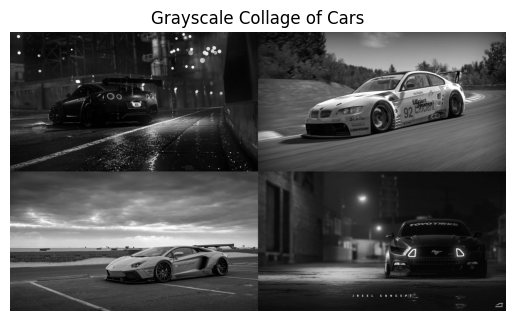

In [90]:
collage_path = '/content/collage.png'
cv2.imwrite(collage_path, collage)
plt.imshow(collage, cmap='gray')
plt.title('Grayscale Collage of Cars')
plt.axis('off')
plt.show()

###  Task 2: Color Space Manipulation - To experiment with different color spaces.

In [91]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

1. Read an image using OpenCV.

In [92]:
def read_image(file_path):
    img = cv2.imread(file_path)
    return img

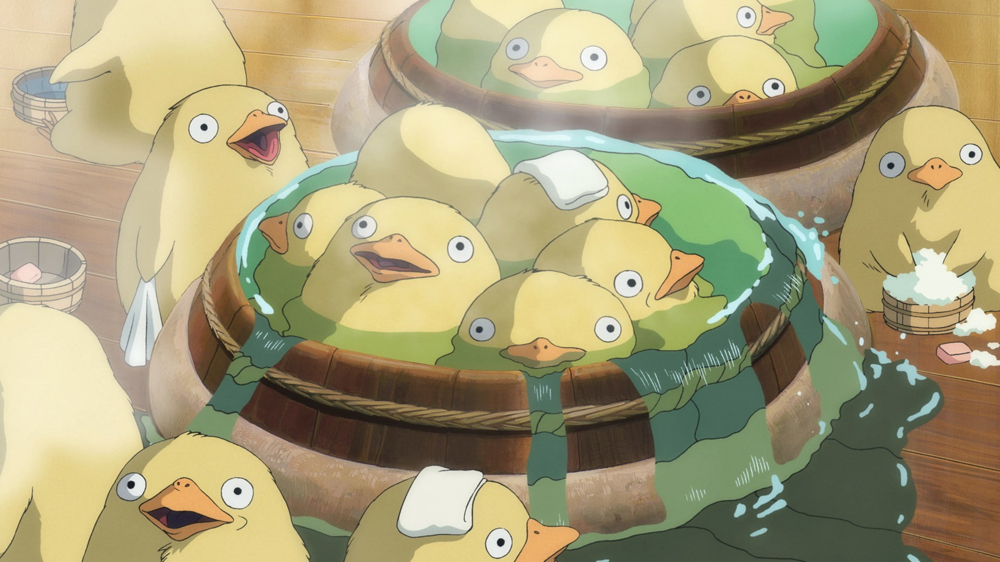

In [93]:
# file_path = '/content/images/nfs_shift.jpg'
file_path = '/content/images/wallpaperflare.com_wallpaper_daplh.jpg'

img = read_image(file_path)
# for colab
cv2_imshow(img)

2. Convert the image from BGR to RGB, HSV color spaces.

In [94]:
def convert_color_spaces(img):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    return img_rgb, img_hsv

In [95]:
img_rgb, img_hsv = convert_color_spaces(img)

3. Display the original image alongside its different color space representations using Matplotlib.

In [96]:
def display_images(original, rgb, hsv):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # for original image
    axes[0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original')
    axes[0].axis('off')

    # for RGB image
    axes[1].imshow(rgb)
    axes[1].set_title('RGB')
    axes[1].axis('off')

    # for HSV image
    axes[2].imshow(hsv)
    axes[2].set_title('HSV')
    axes[2].axis('off')
    plt.tight_layout()
    plt.show()

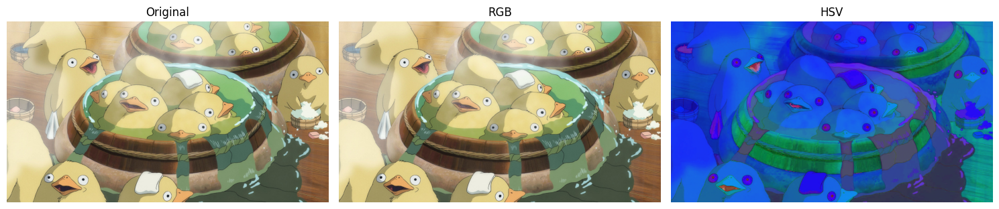

In [98]:
display_images(img, img_rgb, img_hsv)

4. Create a function to convert an image to a user-selected color space and display the result.

In [99]:
def convert_and_display_image(img, color_space):
    if color_space == 'RGB':
        converted_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    elif color_space == 'HSV':
        converted_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    elif color_space == 'GRAY':
        converted_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        print("bruh moemnt")

    plt.imshow(converted_img if color_space != 'GRAY' else converted_img, cmap='gray' if color_space == 'GRAY' else None)
    plt.title(f'{color_space} Image')
    plt.axis('off')
    plt.show()

HSV


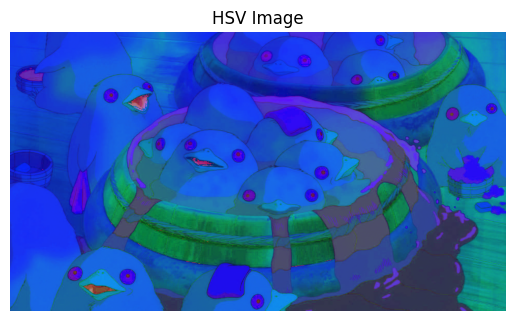

In [100]:
# Change to 'RGB', 'HSV', or 'GRAY'
user_selected_color_space = input()
convert_and_display_image(img, user_selected_color_space)

### Task 3: Interactive Image Display - To Implement an interactive image display tool.


In [101]:
import cv2
import matplotlib.pyplot as plt

1. Read an image using OpenCV.

In [102]:
file_path = '/content/images/wallpaperflare.com_wallpaper_daplh.jpg'
img_og = cv2.imread(file_path)

2. Use Matplotlib to create an interactive plot where clicking on a point in the image displays the pixel value and coordinates.

In [6]:
def onclick(event, img, color_space):
    if event.inaxes:
      x, y = int(event.xdata), int(event.ydata)
      if color_space == 'BGR':
          pixel_value = img[y, x].tolist()
      elif color_space == 'RGB':
          pixel_value = img[y, x].tolist()
      elif color_space == 'GRAY':
          pixel_value = img[y, x]

      print(f'Coordinates: ({x}, {y}), Pixel Value: {pixel_value}')

In [7]:
def onkeypress(event):
    global img_bgr, img_rgb, img_gray, current_image, color_space
    if event.key == 'b':
        current_image = img_bgr
        color_space = 'BGR'
    elif event.key == 'r':
        current_image = img_rgb
        color_space = 'RGB'
    elif event.key == 'g':
        current_image = img_gray
        color_space = 'GRAY'

    ax.imshow(current_image if color_space != 'GRAY' else current_image, cmap='gray' if color_space == 'GRAY' else None)
    ax.set_title(f'{color_space} Image')
    fig.canvas.draw()

In [103]:
# img_bgr = img_og
# img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
# img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

# current_image = img_bgr
# color_space = 'BGR'

# fig, ax = plt.subplots()
# ax.imshow(current_image)
# ax.set_title('BGR Image')
# fig.canvas.mpl_connect('button_press_event', lambda event: onclick(event, current_image, color_space))
# fig.canvas.mpl_connect('key_press_event', onkeypress)

3. Implement functionality to toggle between different color spaces (BGR, RGB, Grayscale) using keyboard inputs

### Task 4: Color Channel Analysis - To analyze and visualize individual color channels.


In [104]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

1. Read an image using OpenCV.

In [105]:
def read_image(file_path):
    img = cv2.imread(file_path)
    return img

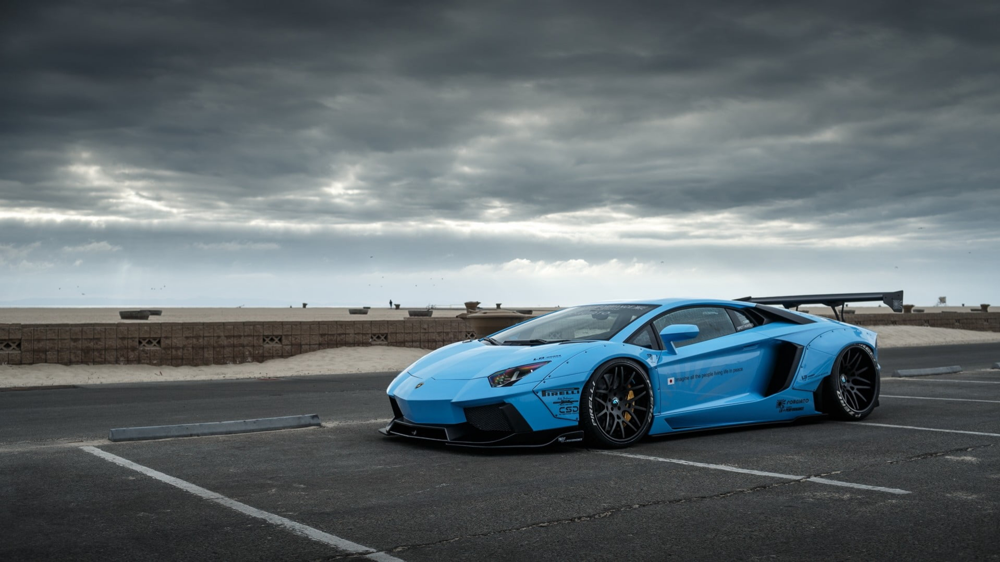

In [106]:
file_path = '/content/images/wallpaperflare.com_wallpaper (2).jpg'
# file_path = '/content/images/wallpaperflare.com_wallpaper (1).jpg'
img = read_image(file_path)
cv2_imshow(img)

2. Split the image into its B, G, and R channels.

In [107]:
def split_channels(img):
    b, g, r = cv2.split(img)
    return b, g, r

In [108]:
b, g, r = split_channels(img)

3. Display each channel separately using Matplotlib.

In [109]:
def display_channels(b, g, r):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(b)
    axes[0].set_title('Blue')
    axes[0].axis('off')

    axes[1].imshow(g)
    axes[1].set_title('Green')
    axes[1].axis('off')

    axes[2].imshow(r)
    axes[2].set_title('Red')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

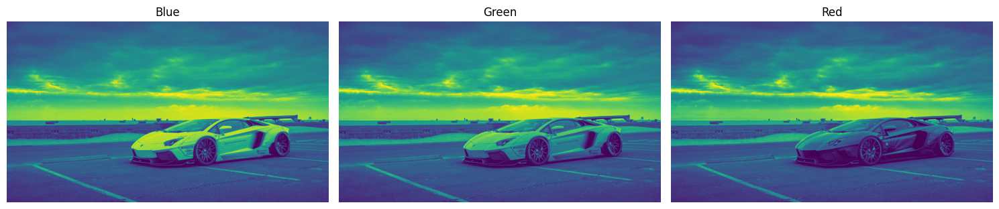

In [110]:
display_channels(b, g, r)

4. Create a composite image by manipulating the intensity of individual channels and display the result.

In [111]:
def create_composite_image(b, g, r, b_intensity=1.0, g_intensity=1.0, r_intensity=1.0):
    b = cv2.convertScaleAbs(b, alpha=b_intensity)
    g = cv2.convertScaleAbs(g, alpha=g_intensity)
    r = cv2.convertScaleAbs(r, alpha=r_intensity)

    composite_img = cv2.merge([b, g, r])
    return composite_img

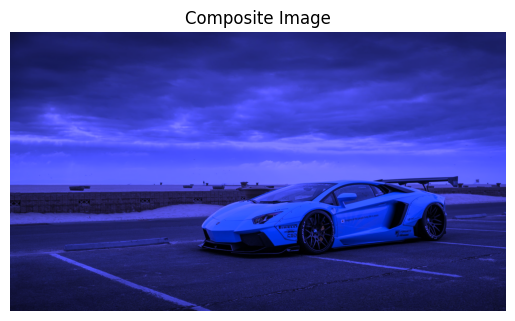

In [112]:
b_intensity = 1.5
g_intensity = 0.5
r_intensity = 0.5

composite_img = create_composite_image(b, g, r, b_intensity, g_intensity, r_intensity)

plt.imshow(cv2.cvtColor(composite_img, cv2.COLOR_BGR2RGB))
plt.title('Composite Image')
plt.axis('off')
plt.show()

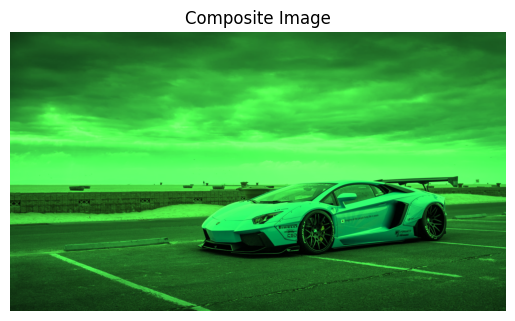

In [113]:
b_intensity = 0.5
g_intensity = 1.5
r_intensity = 0.5

composite_img = create_composite_image(b, g, r, b_intensity, g_intensity, r_intensity)

plt.imshow(cv2.cvtColor(composite_img, cv2.COLOR_BGR2RGB))
plt.title('Composite Image')
plt.axis('off')
plt.show()

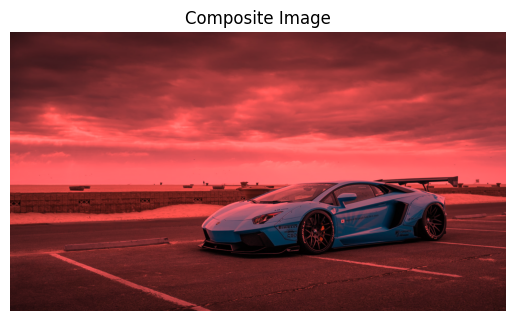

In [114]:
b_intensity = 0.5
g_intensity = 0.5
r_intensity = 1.5

composite_img = create_composite_image(b, g, r, b_intensity, g_intensity, r_intensity)

plt.imshow(cv2.cvtColor(composite_img, cv2.COLOR_BGR2RGB))
plt.title('Composite Image')
plt.axis('off')
plt.show()

### Task 5: Custom Color Maps - To create and apply custom color maps.


In [115]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

1. Read an image using OpenCV.

In [116]:
def read_image(file_path):
    img = cv2.imread(file_path)
    return img

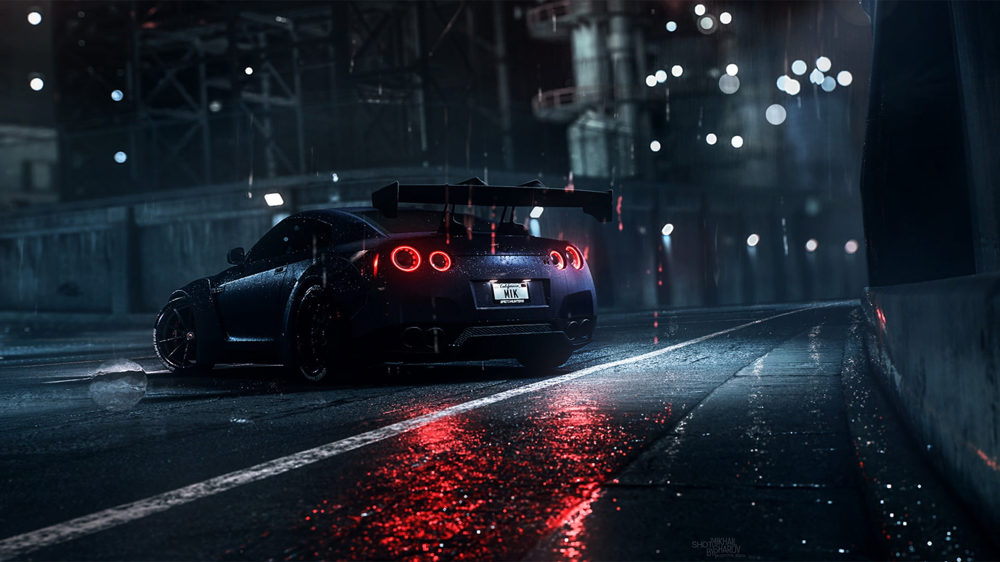

In [117]:
file_path = '/content/images/wallpaperflare.com_wallpaper (1).jpg'
og_img = read_image(file_path)
cv2_imshow(og_img)

 2. Convert the image to grayscale.

In [118]:
def convert_to_grayscale(img):
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return gray_img

In [119]:
gray_img = convert_to_grayscale(og_img)

3. Define a custom color map (e.g., transitioning from blue to green to red).

In [120]:
def custom_colormap():
    cdict = {
        'red':   [(0.0, 0.0, 0.0), (0.5, 0.0, 0.0), (1.0, 1.0, 1.0)],
        'green': [(0.0, 0.0, 0.0), (0.5, 1.0, 1.0), (1.0, 0.0, 0.0)],
        'blue':  [(0.0, 1.0, 1.0), (0.5, 0.0, 0.0), (1.0, 0.0, 0.0)]
    }

    custom_cmap = plt.matplotlib.colors.LinearSegmentedColormap('custom_cmap', cdict, 256)
    return custom_cmap

In [121]:
custom_cmap = custom_colormap()

 4. Apply the custom color map to the grayscale image.

In [122]:
def apply_colormap(gray_img, cmap):
    color_mapped_img = cmap(gray_img / 255.0)
    color_mapped_img = (color_mapped_img[:, :, :3] * 255).astype(np.uint8)
    return color_mapped_img

In [123]:
color_mapped_img = apply_colormap(gray_img, custom_cmap)

5. Display the original, grayscale, and color-mapped images using Matplotlib.

In [124]:
def display_images(original_img, gray_img, color_mapped_img):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # show original image
    axes[0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # show grayscale image
    axes[1].imshow(gray_img, cmap='gray')
    axes[1].set_title('Grayscale Image')
    axes[1].axis('off')

    # show color-mapped image
    axes[2].imshow(color_mapped_img)
    axes[2].set_title('Color-mapped Image')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

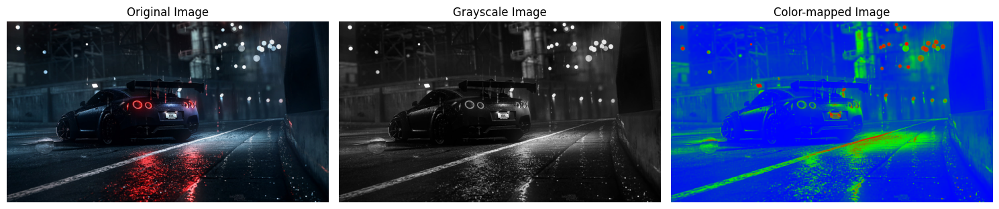

In [125]:
display_images(og_img, gray_img, color_mapped_img)

---

